In [1]:
### 1.Regression Model
### 1.1 Read the result csv as a dataframe df
import pandas as pd
df = pd.read_csv("NYC/15K/combined.csv") 
print("original shape",df.shape)
df.head(1)

original shape (14273, 55)


,FID,latitude,longitude,score,ct_person,ct_car,ct_truck,ct_bus,ct_traffic light,ct_bench,...,chair,lamp,pier,sculpture,desk,fountain,glass,booth,sofa,lake
0,0,40.700909,-74.013504,3.204716,7,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


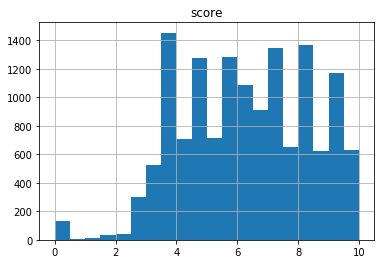

In [4]:
ax=df.hist(column=['score'],bins=20)

In [5]:
# ax=df.hist(column=['PopDen'],bins=100)

In [6]:
import branca.colormap as cm
linear = cm.LinearColormap(
    ['green', 'yellow', 'red'],
    vmin=0, vmax=10
)

linear

In [7]:
linear2=cm.LinearColormap(
            ['green','yellow','orange','red'],
            vmin=0,vmax=10,
            index=[0, 6, 8, 10]
        )
linear2

In [8]:
linear3=cm.linear.YlGnBu_09
linear4=cm.linear.OrRd_09.scale(0,10)
linear3

In [9]:
linear4

In [10]:
linear5=cm.linear.Spectral_07.scale(0,10)
linear5

In [11]:
linear(5)

'#ffff00'

In [17]:
import folium
#grab a random sample from df
df_s = df.sample(n=14000)
Center = [df_s['latitude'].mean(),df_s['longitude'].mean()]

GSV_locations =df_s[['latitude','longitude']]
GSV_list = GSV_locations.values.tolist()

clr1=['maroon','red','orange','yellow','#80ff80','#00cc00','#008000']
clr1.reverse()
clr2=['#FFE8DB','#FE9F6D','#FC600A','#9D3802','#341809']
clr=clr2

### Custom Colors
df_s['marker_color'] = pd.cut(df_s['score'], bins=5, 
                              labels=clr)

#creating a map that’s centered to our sample
map0 = folium.Map(location=Center,tiles='cartodbpositron',zoom_start=13) 
#Mapbox Bright/Stamen Toner/Mapbox Control Room/MapQuest Open Aerial/OpenStreetMap/cartodbpositron/cartodbdark_matter

# Make a data frame with dots to show on the map
for index, row in df_s.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],radius=2,fill=True,
                        color=linear4(row['score']),opacity=0.8,
                        fill_color=linear4(row['score']),fill_opacity=0.3,
                        ).add_to(map0)
    
# data = pd.DataFrame({
# 'lat':[31.236398,31.202546,31.247263],
# 'lon':[121.507395,121.589438,121.538021],
# 'name':['Lujiazui','Zhangjiang','East']
# })
# data

# for i in range(0,len(data)):
#     folium.Marker([data.iloc[i]['lat'], data.iloc[i]['lon']], popup=data.iloc[i]['name']).add_to(map0)

# for GSVpoint in GSV_list:
#     folium.CircleMarker(GSVpoint, radius=list(df_s['score']), color='red', fill=True, opacity=1).add_to(map0)
map0.save("NYC.html")
map0